In [22]:
%load_ext autoreload
%autoreload 2
import numpy as np
from jax import config
config.update("jax_enable_x64", True)
from matplotlib import pyplot as plt
from scipy.integrate import odeint
from scipy.optimize import fsolve
np.random.seed(0)
from jax import numpy as jnp
import numpy as np
from gaussian_toolbox import pdf,conditional,approximate_conditional
import matplotlib.pyplot as plt
import jax


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [23]:
N=30
T=200
dt=0.05
def vanderpol(x, t, mu=1):
    x, y = x[..., 0], x[..., 1]
    return np.array([y, mu * (1 - x ** 2) * y - x])
x0_array = np.random.randn(N, 2)*4
x_data=np.zeros((N,T,2))
for i in range(N):
    x0=x0_array[i,:]
    time=np.arange(0,T*dt,dt)
    x_mu = odeint(vanderpol, x0, time)
    x_data[i,:,:] = x_mu + np.random.randn(*x_mu.shape) * 0.2
    
# x0 = np.array([2, -2.])
# time = np.arange(0, 40, dt)
# x_mu = odeint(vanderpol, x0, time)
# x_data = x_mu + np.random.randn(*x_mu.shape) * 0.2

In [24]:
from timeseries_models import state_model, observation_model, state_space_model
Dz = 2
Dk = 5
Dx = x_data.shape[-1]

sm = state_model.LSEMStateModel(Dz, Dk)
om = observation_model.LinearObservationModel(Dx, Dz)
ssm = state_space_model.StateSpaceModel(om, sm)
llk_list, p0_dict, smooth_dict, two_step_smooth_dict = ssm.fit(x_data)


EM Algorithm: 100%|██████████| 100/100 [01:16<00:00,  1.30it/s, iteration=99, log_likelihood=1779.6302132032154, total_time=0.7s]

EM reached the maximal number of iterations.


In [25]:
A=ssm.sm.A
b=ssm.sm.b
W=ssm.sm.W


Qz=ssm.sm.Qz

In [26]:
C=ssm.om.C
d=ssm.om.d
Qx=ssm.om.Qx

In [362]:
class state_model:
    def __init__(self,A,b,W,Qz,B):
        self.A=A
        self.B_u=jnp.array([[B],[-B]])
        self.b=b
        self.W=W
        self.Dz=np.shape(A)[0]
        self.Dk=np.shape(A)[1]-np.shape(A)[0]
        self.Dphi=np.shape(A)[1]
        self.Du=np.shape(self.B_u)[1]
        self.Qz =Qz
        self.density=approximate_conditional.LinearControlLSEMGaussianConditional(M=np.array([self.A,]),b=np.array([self.b,]),W=self.W,B_u=np.array([self.B_u,]),Sigma=np.array([self.Qz,]),num_cond_dim=self.Dz,num_control_dim=self.Du)
   
    def compute_z_t_plus_one(self,z_t,u_t):
        self.density.update_phi()
        phi_t=self.density.evaluate_phi(np.array(z_t)[None])[0]

        return np.matmul(self.A,phi_t)+np.matmul(self.B_u,u_t)+self.b+jnp.dot(jnp.linalg.cholesky(self.Qz), np.random.normal(size=((self.Qz).shape[0],)))
        

In [391]:
# B=0.1#worked for horizontal
B=0.1
sm=state_model(A=A,b=b,W=W,Qz=Qz,B=B)

In [392]:
class obs_model:
    def __init__(self,C,d,Qx):
        # self.noise_scale=noise_scale
        # self.Dx=Dx
        self.C=C
        self.d=d
        self.Qx = Qx
        self.density = conditional.ConditionalGaussianPDF(M=jnp.array([self.C]), b=jnp.array([self.d]), Sigma=jnp.array([self.Qx]))
    def compute_x_t(self,z_t):
        return np.matmul(self.C,z_t)+self.d+jnp.dot(jnp.linalg.cholesky(self.Qx), np.random.normal(size=((self.Qx).shape[0],)))
   
        

In [393]:
#Only paramter here is the obs_noise which is defined as follows!!
Dx=2
obs_noise=0.01
om=obs_model(C,d,Qx)


In [394]:
def ring_attractor(o_t,t):#r_fot=r_0-r and theta_ot=c
    r_0=4
    c_0=-0.1
    r=np.sqrt(o_t[0]**2+o_t[1]**2)
    x_dot=(r_0-r)*(o_t[0]/r) - r*(o_t[1]/r)*c_0
    y_dot=(r_0-r)*(o_t[1]/r) + r*(o_t[0]/r)*c_0
    return np.array([x_dot,y_dot])
def vanderpol_pref(x, t, mu=2):
    x, y = x[..., 0], x[..., 1]
    return np.array([y, mu * (1 - x ** 2) * y - x])
    

def preferred_dynamics(o_t):
    #x_t+1=x_t + dx/dt . dt
    # time = np.array([0, 0.1]) 
    time = np.arange(0.0,0.35,dt)#0.25 for vertical 0.1 for horizontal


    
    mu_preferred=odeint(ring_attractor,o_t,time)[-1]
   
    sigma_preferred = jnp.array([jnp.array([[0.0001,0],[0,0.0001]])])
    preff_distri=pdf.GaussianPDF(Sigma=sigma_preferred,mu=np.array([mu_preferred]))
    return preff_distri,mu_preferred

In [395]:
state_density=sm.density
obs_density=om.density

In [396]:
#defining the prior state distribution p(s0)
Dz=2

prior_noise=0.000001
mu=np.array([np.array([2.0,-2.0])])

Sigma=jnp.array([prior_noise*jnp.eye(Dz)])
prior=pdf.GaussianPDF(Sigma=Sigma,mu=mu)



In [397]:
def compute_q_o_t_plus_one_given_u_t(prediction_density,obs_density):
    '''computes q(o_t+1|u_t) required to compute KL divergence term in the 
    EFE expression FOR A PARTICULAR TIME INSTANCE by integrating the observation
    density p(o_t+1|s_t+1) with the prediction density p(s_t+1|u_{1:t},o_{1:t})'''
    sigma_p_inv=np.linalg.inv(prediction_density.Sigma)
    sigma_o_inv=np.linalg.inv(obs_density.Sigma)
    sigma_o=obs_density.Sigma
    sigma_p=prediction_density.Sigma
    
    
    mu=prediction_density.mu
    
    sigma=np.matmul(sigma_o,np.matmul(sigma_o_inv+sigma_p_inv, sigma_p))
    q_o_t_plus_one_given_u_t=pdf.GaussianPDF(Sigma=sigma,mu=mu)
    return q_o_t_plus_one_given_u_t

    

In [398]:
def compute_KL_div_gaussian(gaussian_1,gaussian_2):
    mu_1=gaussian_1.mu[0]
    mu_2=gaussian_2.mu[0]
    sigma_1=gaussian_1.Sigma[0]
    sigma_2=gaussian_2.Sigma[0]
    return 0.5*(jnp.log(jnp.linalg.det(sigma_2)/jnp.linalg.det(sigma_1)) - 2 + jnp.trace(jnp.matmul(jnp.linalg.inv(sigma_2),sigma_1)) + jnp.matmul((mu_1-mu_2).T,jnp.matmul(jnp.linalg.inv(sigma_2),(mu_1-mu_2))))
        

In [399]:
def compute_expected_entropy(obs_density):
    # s_t=prediction.sample(num_samples=1,key=key)[0][0]
    # obs_density=om.compute_density(s_t)   
    n=obs_density.Dx
    det_sigma_obs=np.linalg.det(obs_density.Sigma)
    # print(det_sigma_obs)
    return (0.5*n)*np.log(2*np.pi) + 0.5*np.log(det_sigma_obs) - 0.5*n

    

In [400]:
def compute_G_next_step(prediction,obs_density,o_t):
    preff_distri,mu_preferred=preferred_dynamics(o_t)
    q_o_t_plus_one_given_u_t=compute_q_o_t_plus_one_given_u_t(prediction,obs_density)
    
    plt.scatter(q_o_t_plus_one_given_u_t.mu[0][0],q_o_t_plus_one_given_u_t.mu[0][1],color='red',label='future observations for +1 and -1 vertical motion')
    term_1=compute_KL_div_gaussian(q_o_t_plus_one_given_u_t,preff_distri)
    term_2=compute_expected_entropy(obs_density)
    return term_1 + term_2, mu_preferred

    
    

In [401]:
def generate_circle(radius, num_points=100):
    angles = np.linspace(0, 2 * np.pi, num_points)
    x = radius * np.cos(angles)
    y = radius * np.sin(angles)
    return x, y

# Example usage

In [402]:
key = jax.random.PRNGKey(86)

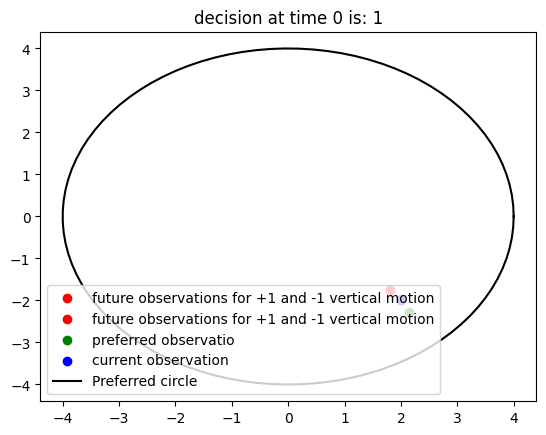

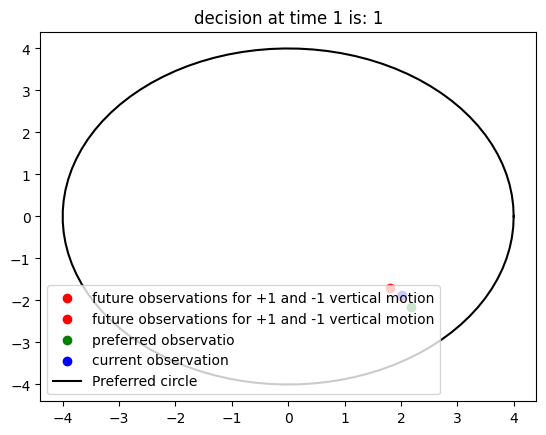

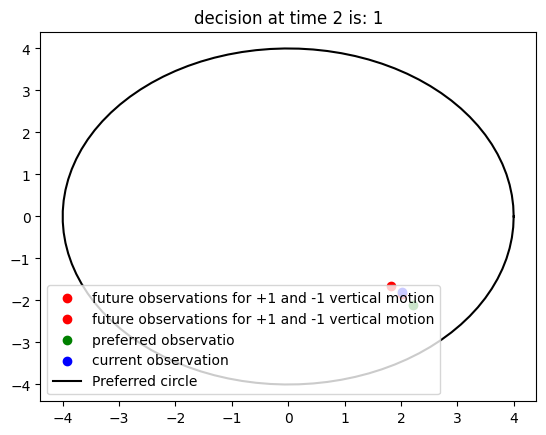

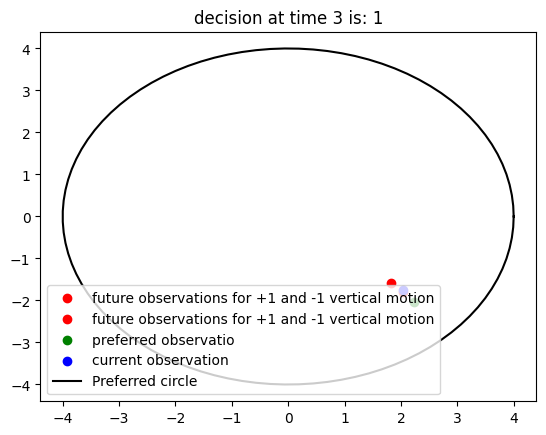

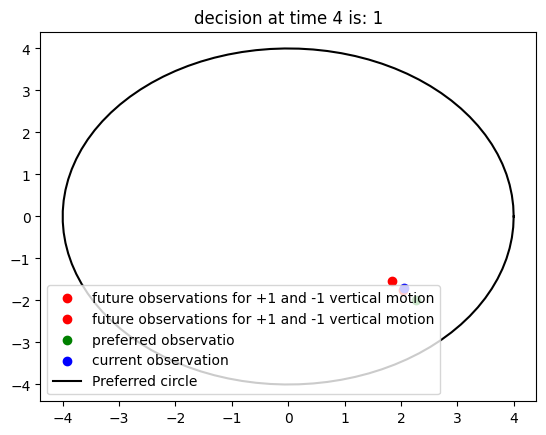

...

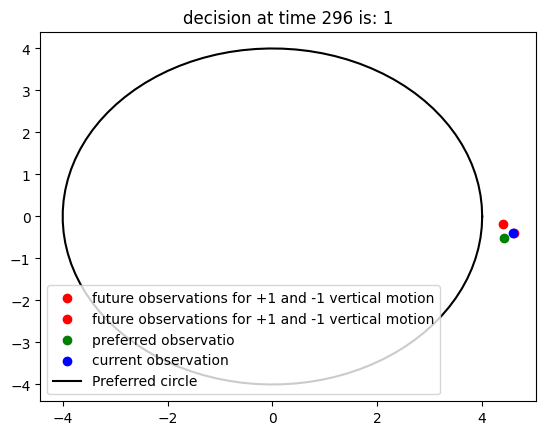

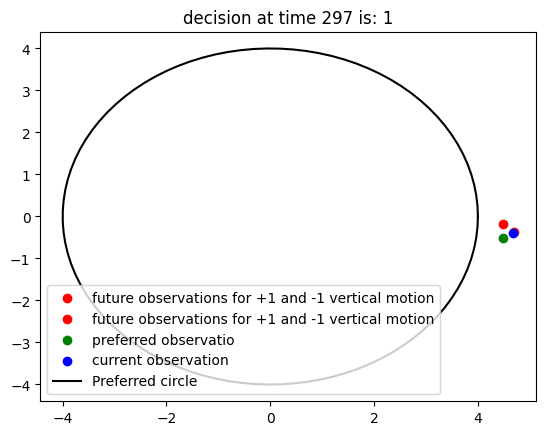

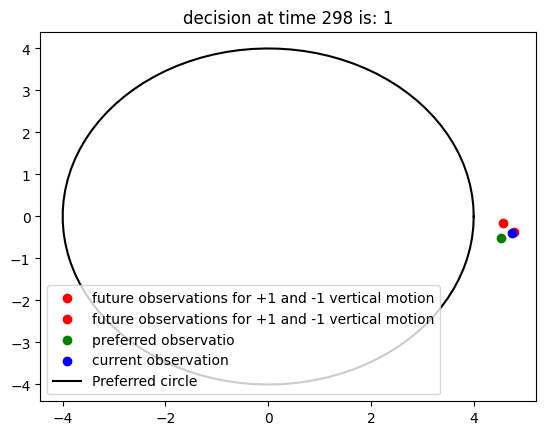

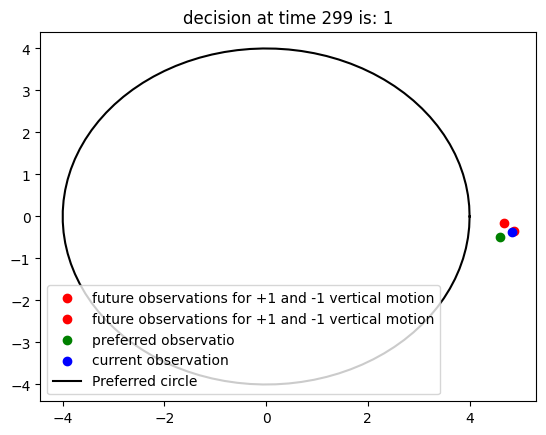

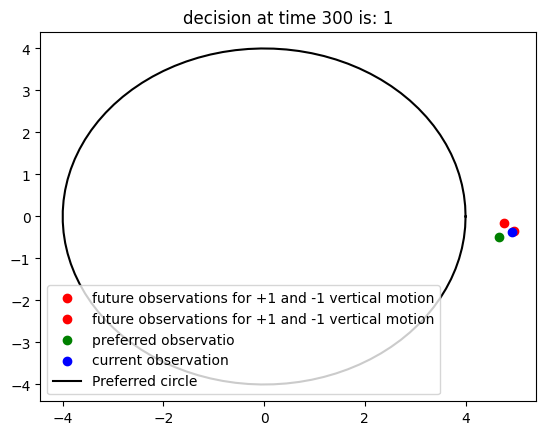

In [403]:
#setting prediction initially as prior
T=300

prediction=prior



state_timeseries=[]
obs_timeseries=[]
filter_list=[]
prediction_list=[]
action_list=[]
prediction_list.append(prediction)

preferred_list=[]


z0=np.array([2.0,-2.0])

mu=1
z_t=z0

o_t=z0+np.random.randn((2)) * .0
obs_timeseries.append(o_t)
for i in range(T+1):
    
    
    #to generate observations we sample s_t and o_t, not part of the agent performing active inference
    #ENVIRONMENT DYNAMICS
    #TODO:Need to make sepraete dynamcis for the internal model and the actual environment model seperately
    
#     s_t=prediction.sample(num_samples=1,key=key)[0][0] #P(Zt|x1:t-1) P(Zt|Zt-1)

   
#     o_t=om.compute_x_t(s_t)
#     state_timeseries.append(s_t)
#     obs_timeseries.append(o_t)
#     # sm.set_B_u(o_t,om.C,om.d)
#     state_density=sm.density
    
    
    
    
 
    
   
    
    
    
    
    
    #AGENT DYNAMICS 
    
    
    #now the agent only has access to o_t, using this it performs estimation of G of the next step to perfomr decision making
    #at filter density computes
    p_s_given_o=obs_density.affine_conditional_transformation(prediction)

    filter=p_s_given_o.condition_on_x(np.array([o_t]))
    filter_list.append(filter)
    
    
    
    
    
    
    #modifyong for P(O_t+1|c)
    #for action +1
#     time = np.arange(0,0.1,0.1)
#     z_t_aux_plus_1 = odeint(vanderpol,z_t, time) + 

#     o_t_aux_plus_1=z_t_aux_plus_1#+np.random.randn((2)) * .2
    
    #FINISH THISSSS!!!!!!!!!!
    
    
    
    

    #made this line on 16/02/2025: We were not updating the state density with the new B_u before
 
    #now the filter density is used to estimate prediciton densities of s_t+1 for each of the possible actions +1 and -1.
    #This filter density aling with obs_density is passed onto the deifned compute_G_next_step function

    G_plus_one,mu_preferred_plus_one=compute_G_next_step((state_density.set_control_variable(np.array([np.array([+1])]))).affine_marginal_transformation(filter),obs_density,o_t)
    G_minus_one,mu_preferred_minus_one=compute_G_next_step((state_density.set_control_variable(np.array([np.array([-1])]))).affine_marginal_transformation(filter),obs_density,o_t)
    plt.scatter(mu_preferred_plus_one[0],mu_preferred_plus_one[1],color='green',label='preferred observatio')
    plt.scatter(o_t[0],o_t[1],color='blue',label='current observation')
    x_circle_1,y_circle_1=generate_circle(4)
    plt.plot(x_circle_1, y_circle_1, color="black", linewidth=1.5, linestyle="-", label="Preferred circle")

    
    #The EFE values are compared and decision made
    
    if G_plus_one<G_minus_one:
        u_t=+1
        mu_preferred=mu_preferred_plus_one
  
    else:
        u_t=-1
        mu_preferred=mu_preferred_minus_one
   
    plt.title(f'decision at time {i} is: {u_t}')
    plt.legend(loc='lower left')
    plt.show()
     
    # u_t=0
    # print(np.shape(np.array([u_t])))
    action_list.append((np.array([u_t])))
    preferred_list.append(mu_preferred)


    
    # the prediction density computed again for the chosen action and the iteration is continued, making decisions and computing predcition densties
    prediction=(state_density.set_control_variable(np.array([np.array([u_t])]))).affine_marginal_transformation(filter)
    prediction_list.append(prediction)
        #New environmental dynamcis
    u_t=action_list[-1]
    
    
    time = np.array([0.0,dt])
    z_t= (odeint(vanderpol,z_t, time))[-1] + np.matmul(state_density.B_u,u_t)[0]
    o_t = (odeint(vanderpol,z_t, time)[-1] + np.matmul(om.C,np.matmul(state_density.B_u,u_t)[0]))


    
    
    


    
    
    # o_t=z_t+np.random.randn((2)) * .0
    obs_timeseries.append(o_t)
   
   
    
    
    
    
    
    
    

                


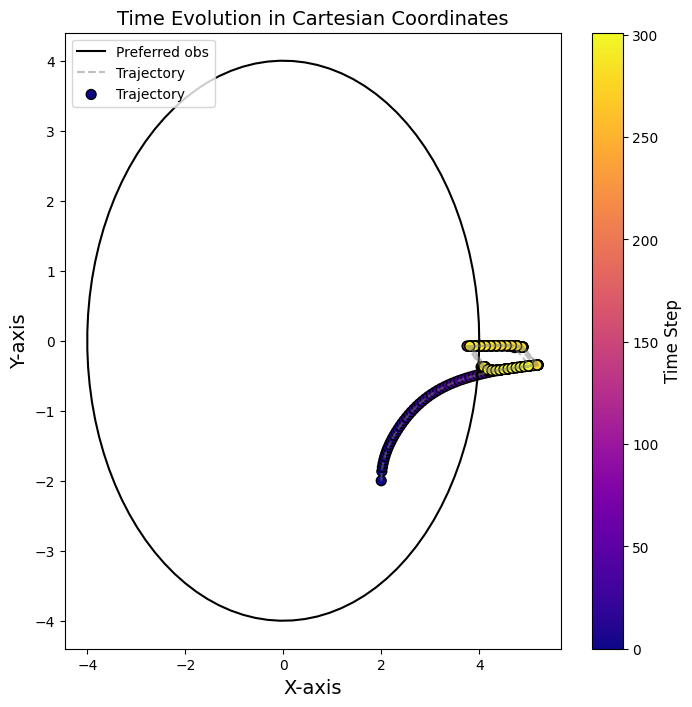

In [404]:
import numpy as np
import matplotlib.pyplot as plt

# Sample x, y time series data (Replace with actual data)
data_main = obs_timeseries  # Primary trajectory data
# data_ref =x_data[0,:,:]



# Extract x, y components for main time series
x_values_main = [point[0] for point in data_main]
y_values_main = [point[1] for point in data_main]

# # Extract x, y components for reference trajectory
# x_values_ref = [point[0] for point in data_ref]
# y_values_ref = [point[1] for point in data_ref]


# Time steps for color mapping
time_steps = range(len(data_main))
colors = plt.cm.plasma([t / max(time_steps) for t in time_steps])  # Cooler to warmer colors

# Create figure
fig, ax = plt.subplots(figsize=(8, 8))

# Plot the reference trajectory in black
# ax.plot(x_values_ref, y_values_ref, color="gray", linewidth=1.5, linestyle="-", label="Reference Trajectory without action")

#plot circle 1 in red
x_circle_1,y_circle_1=generate_circle(4)
ax.plot(x_circle_1, y_circle_1, color="black", linewidth=1.5, linestyle="-", label="Preferred obs")


# Plot main trajectory as a dashed line
ax.plot(x_values_main, y_values_main, color="gray", alpha=0.5, linestyle="--", label="Trajectory")


# Scatter plot of main time series
scatter = ax.scatter(x_values_main, y_values_main, c=time_steps, cmap='plasma', edgecolor='k', s=50,label='Trajectory')

# scatter = ax.scatter(x_values_main2, y_values_main2, c=time_steps[:-1], cmap='plasma', edgecolor='k', s=50,label='Trajectory other predicitons')





# Add a colorbar to indicate time evolution
cbar = plt.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Time Step', fontsize=12)

# Set plot title and labels
ax.set_xlabel("X-axis", fontsize=14)
ax.set_ylabel("Y-axis", fontsize=14)
ax.set_title("Time Evolution in Cartesian Coordinates", fontsize=14)
ax.legend(loc="upper left")

plt.show()
